## Copyright 2023 Google LLC

In [ ]:
# Copyright 2023 Google LLC
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#      http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

In [2]:
!pip install -r requirements.txt
!pip install -U transformers diffusers
!pip install -y torch torchvision torchaudio
!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
!python3 -m pip install torch==2.0.0+cu117 torchvision==0.15.1+cu117 torchaudio==2.0.1 --index-url https://download.pytorch.org/whl/cu117


Usage:   
  pip install [options] <requirement specifier> [package-index-options] ...
  pip install [options] -r <requirements file> [package-index-options] ...
  pip install [options] [-e] <vcs project url> ...
  pip install [options] [-e] <local project path> ...
  pip install [options] <archive url/path> ...

no such option: -y
Looking in indexes: https://download.pytorch.org/whl/cu121
Looking in indexes: https://download.pytorch.org/whl/cu117


# ControlNet depth with StyleAligned over SDXL

In [5]:
from diffusers import ControlNetModel, StableDiffusionXLControlNetPipeline, AutoencoderKL
from diffusers.utils import load_image
from transformers import DPTImageProcessor, DPTForDepthEstimation
import torch
import mediapy
import sa_handler
import pipeline_calls

In [6]:
# init models

depth_estimator = DPTForDepthEstimation.from_pretrained("Intel/dpt-hybrid-midas").to("cuda")
feature_processor = DPTImageProcessor.from_pretrained("Intel/dpt-hybrid-midas")

controlnet = ControlNetModel.from_pretrained(
    "diffusers/controlnet-depth-sdxl-1.0",
    variant="fp16",
    use_safetensors=True,
    torch_dtype=torch.float16,
).to("cuda")
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16).to("cuda")
pipeline = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    vae=vae,
    variant="fp16",
    use_safetensors=True,
    torch_dtype=torch.float16,
).to("cuda")
pipeline.enable_model_cpu_offload()

sa_args = sa_handler.StyleAlignedArgs(share_group_norm=False,
                                      share_layer_norm=False,
                                      share_attention=True,
                                      adain_queries=True,
                                      adain_keys=True,
                                      adain_values=False,
                                     )
handler = sa_handler.Handler(pipeline)
handler.register(sa_args, )

config.json:   0%|          | 0.00/9.88k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/490M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/382 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.27k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/2.50G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/631 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

,

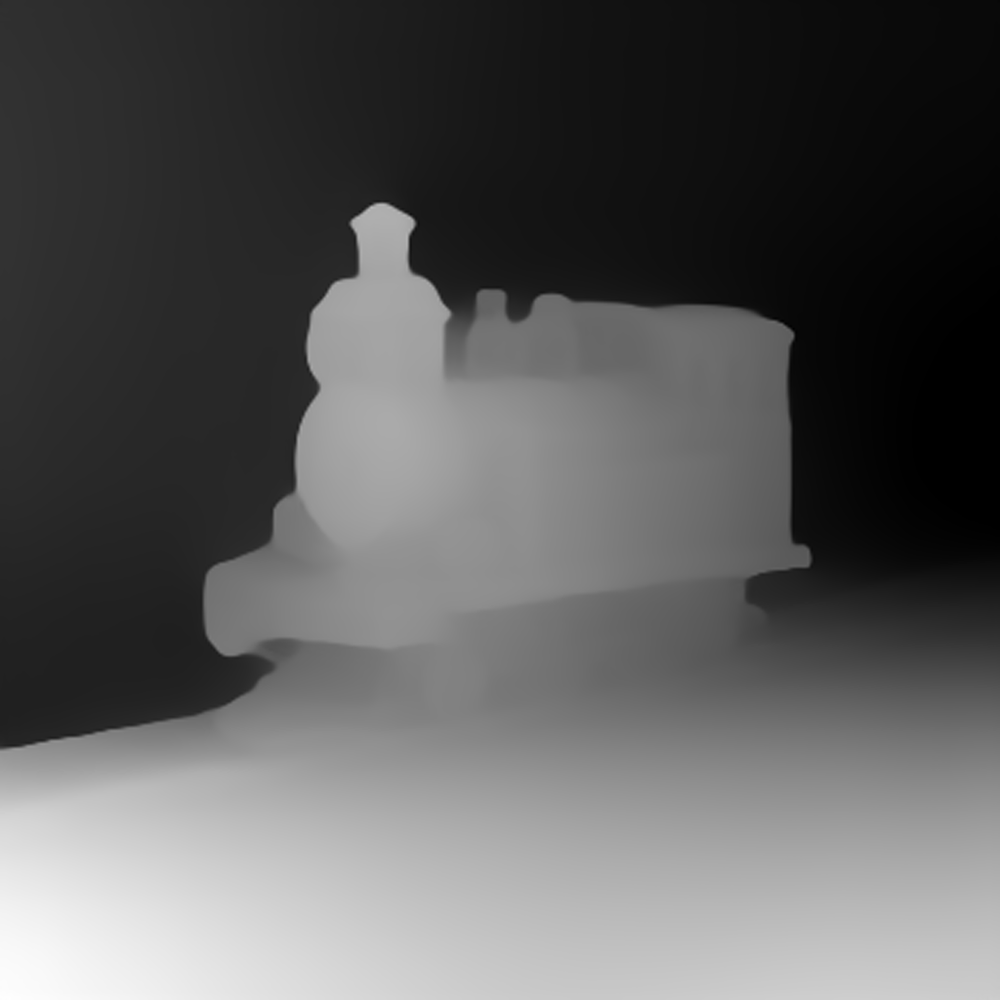
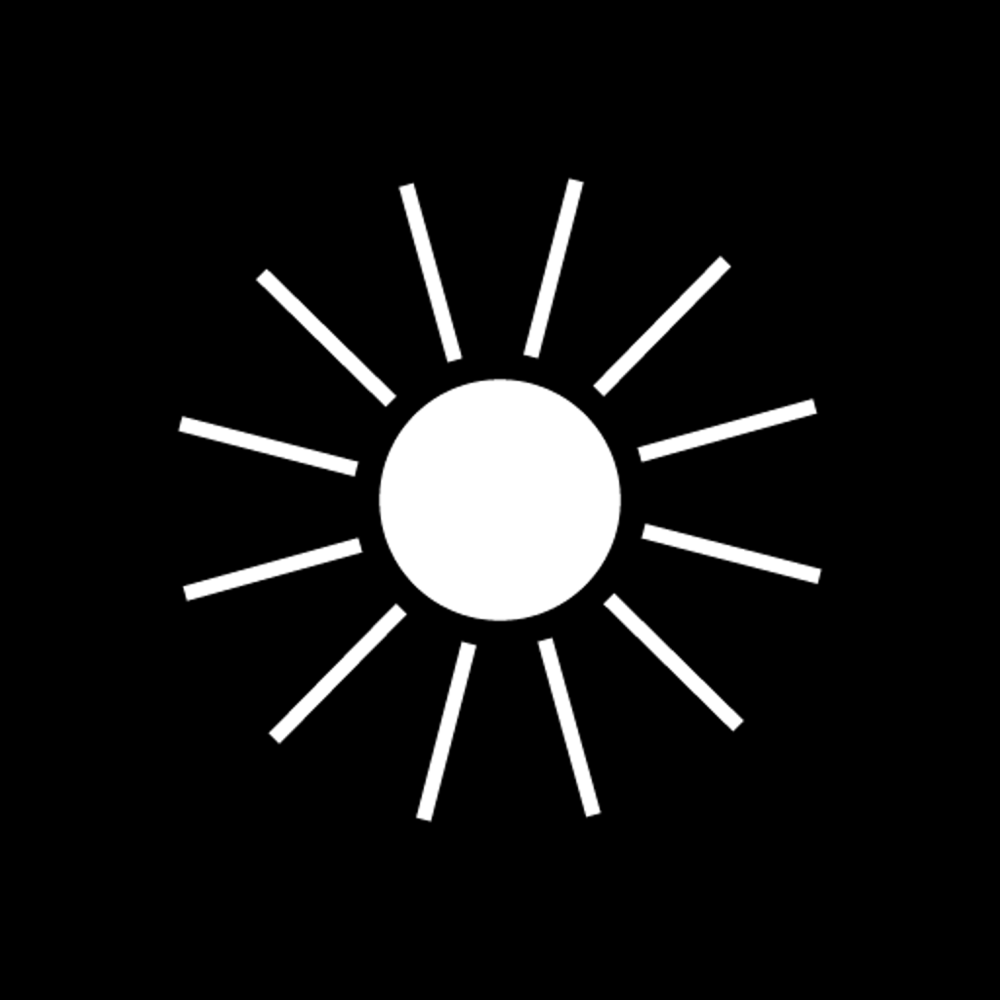

In [7]:
# get depth maps

image = load_image("./example_image/train.png")
depth_image1 = pipeline_calls.get_depth_map(image, feature_processor, depth_estimator)
depth_image2 = load_image("./example_image/sun.png").resize((1024, 1024))
mediapy.show_images([depth_image1, depth_image2])

  0%|          | 0/50 [00:00<?, ?it/s]

reference,depth,result 1,result 2,result 3

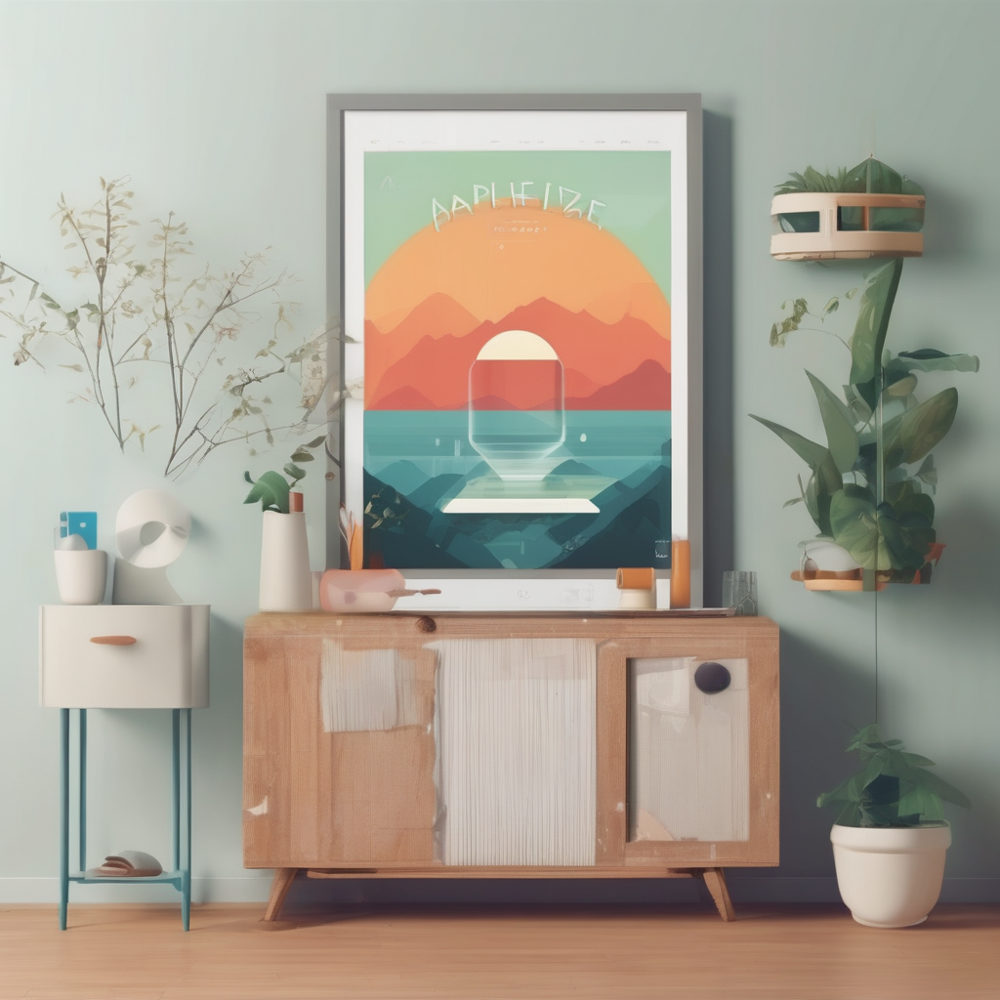
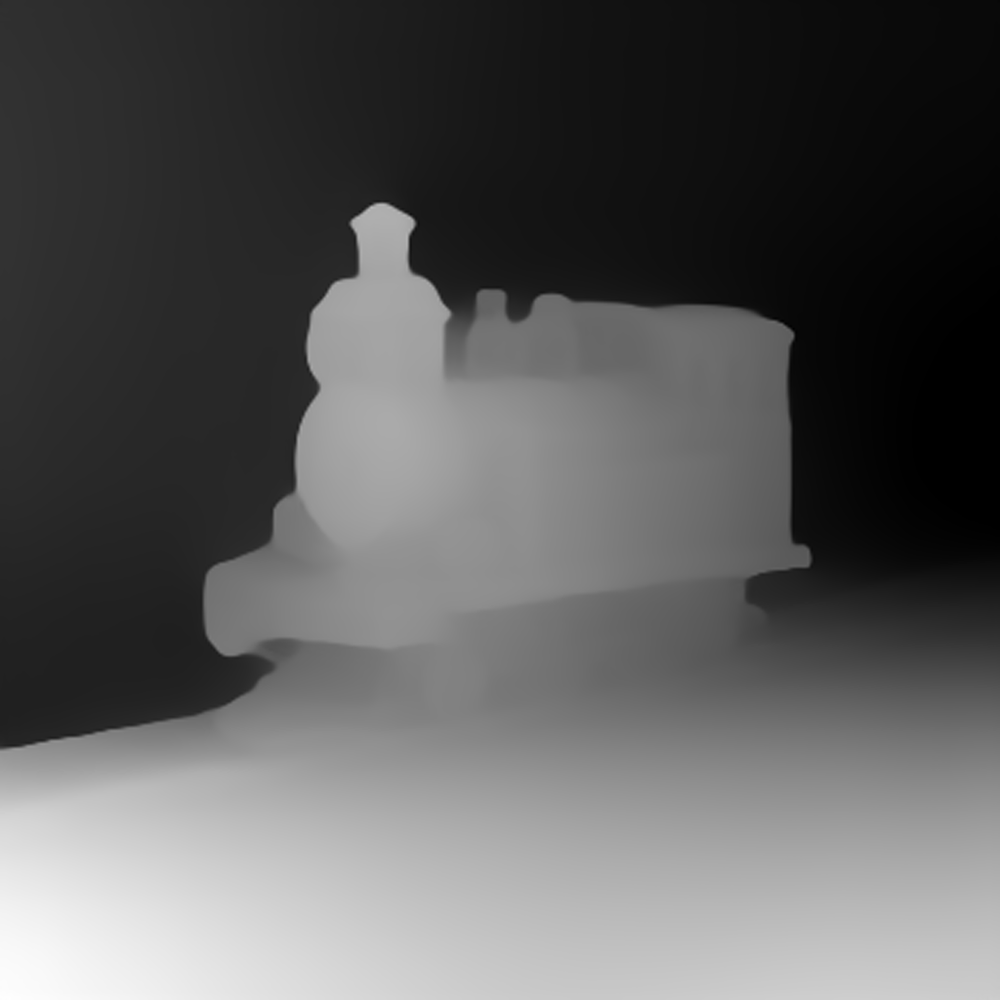
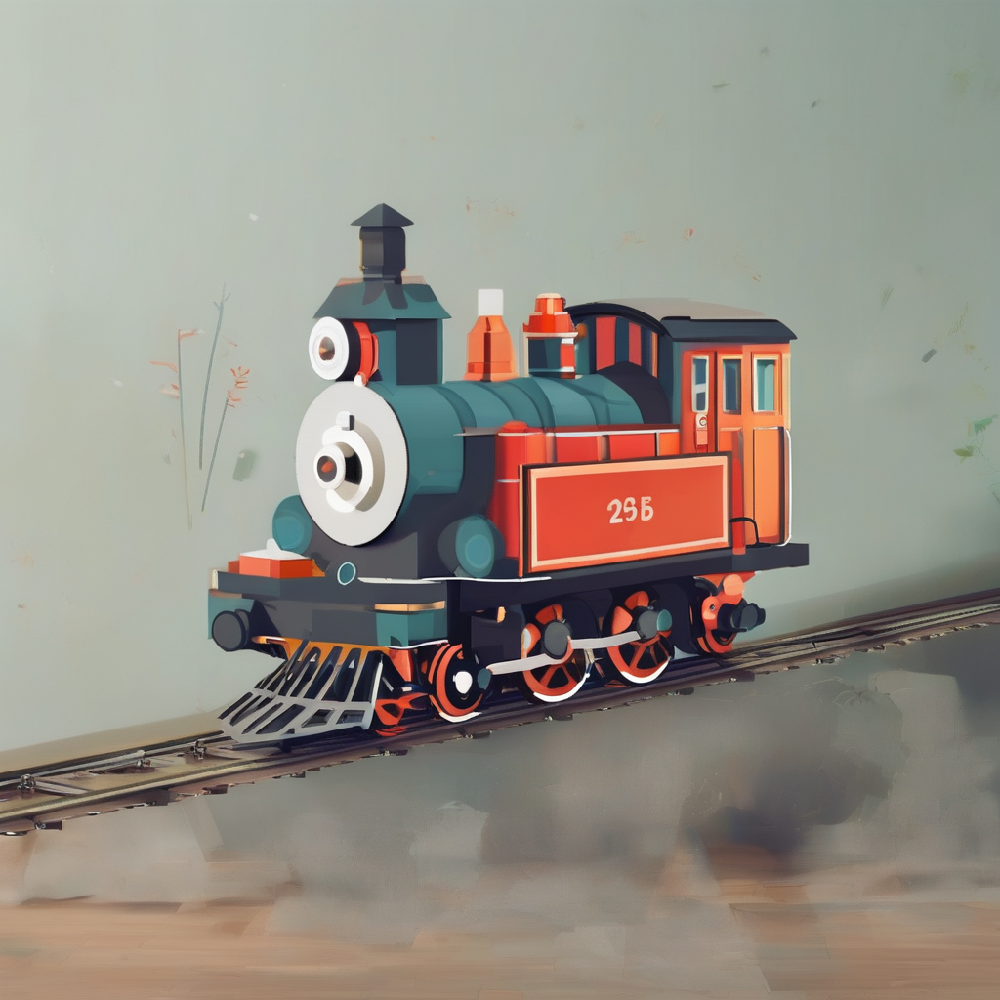
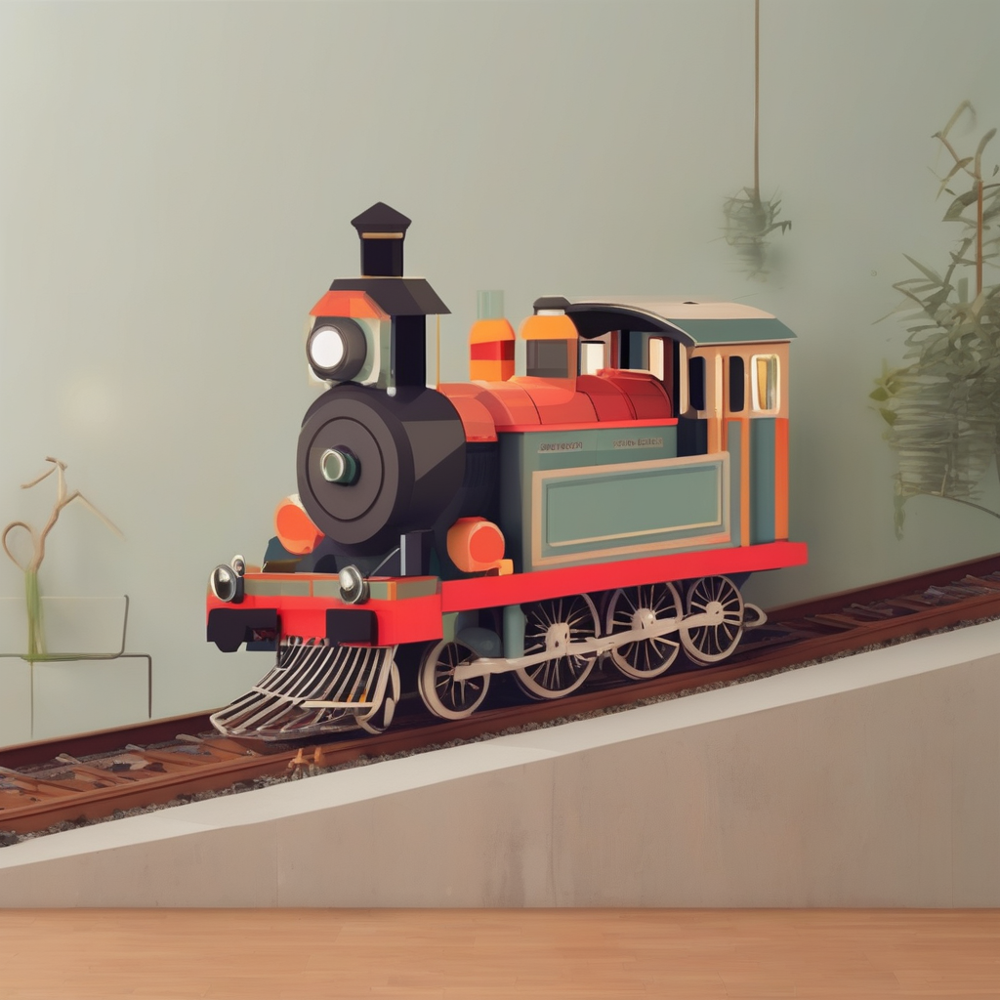
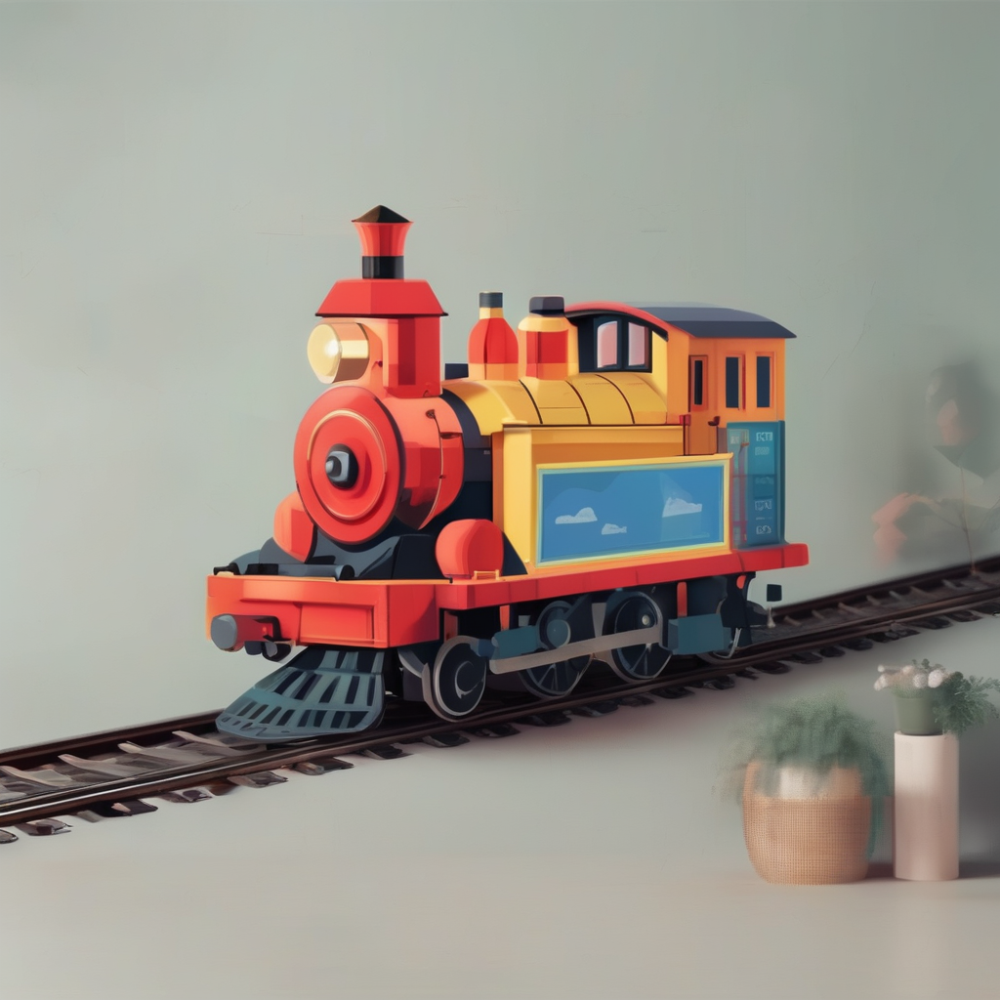

  0%|          | 0/50 [00:00<?, ?it/s]

reference,depth,result 1,result 2,result 3

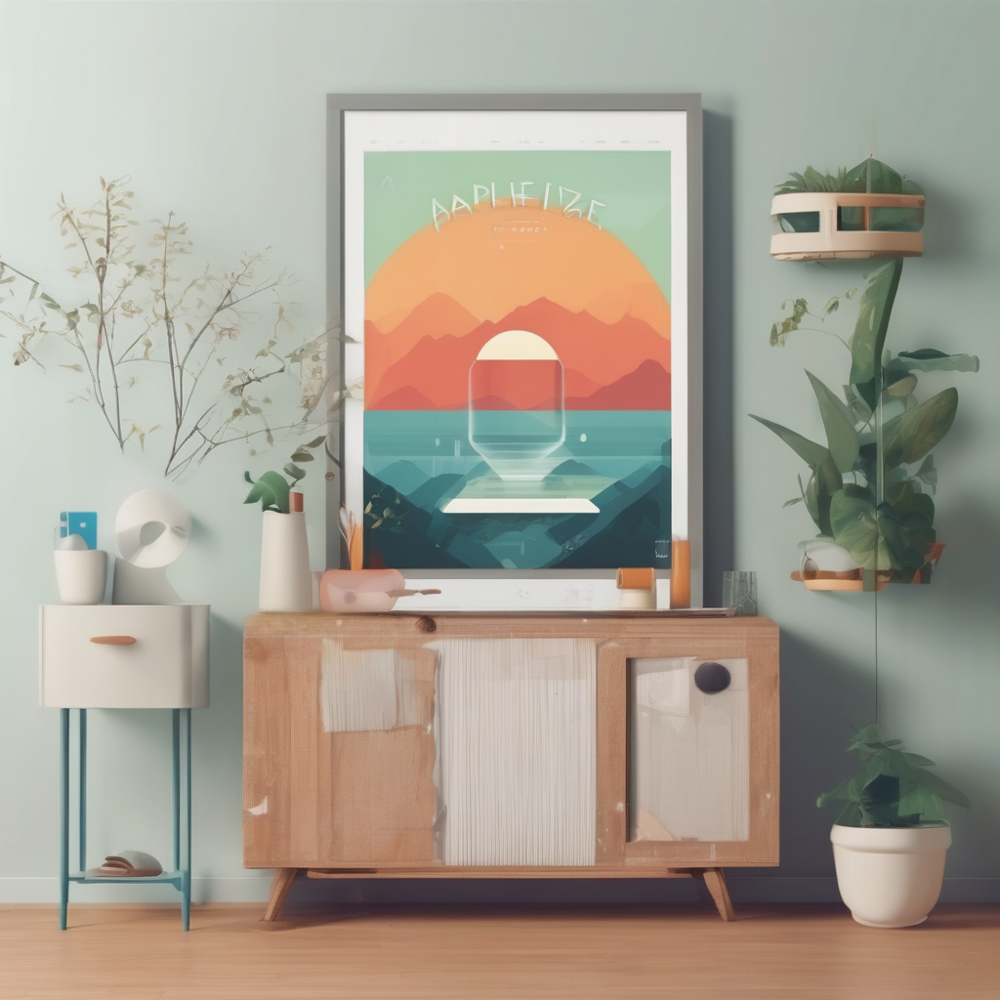
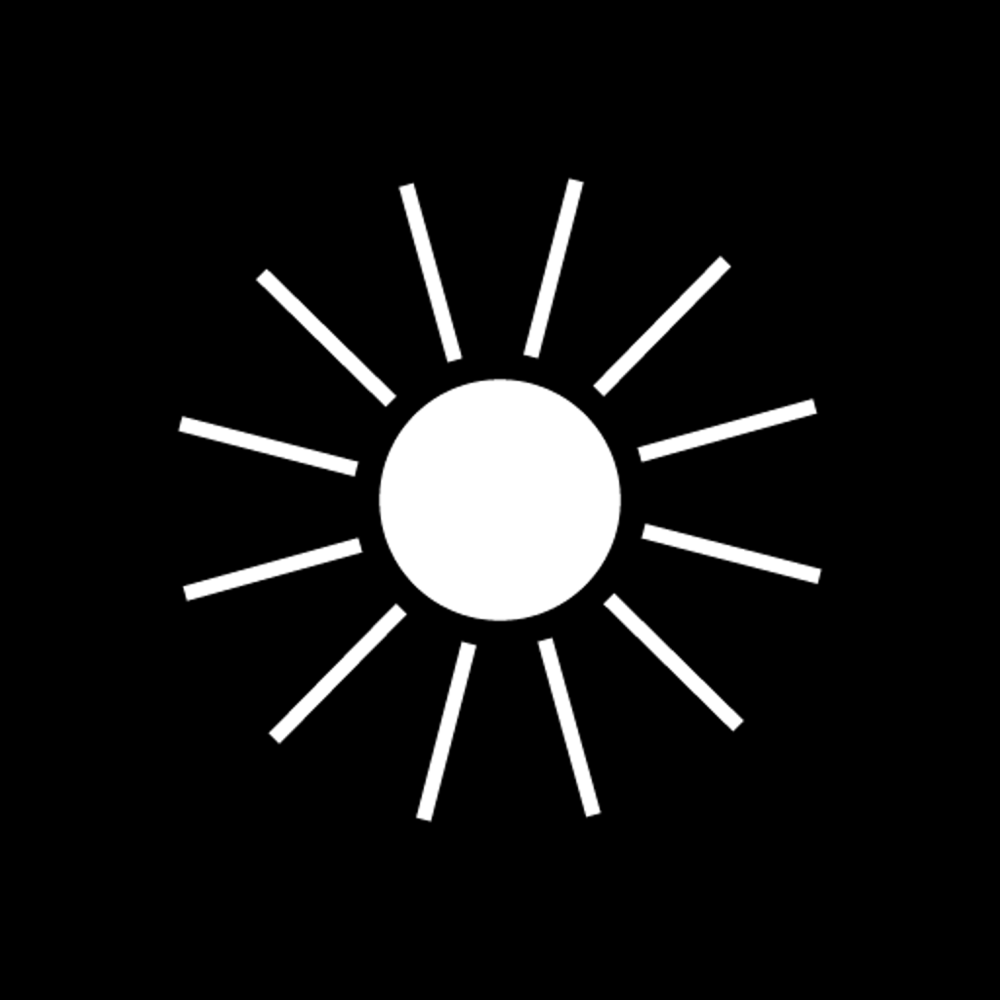
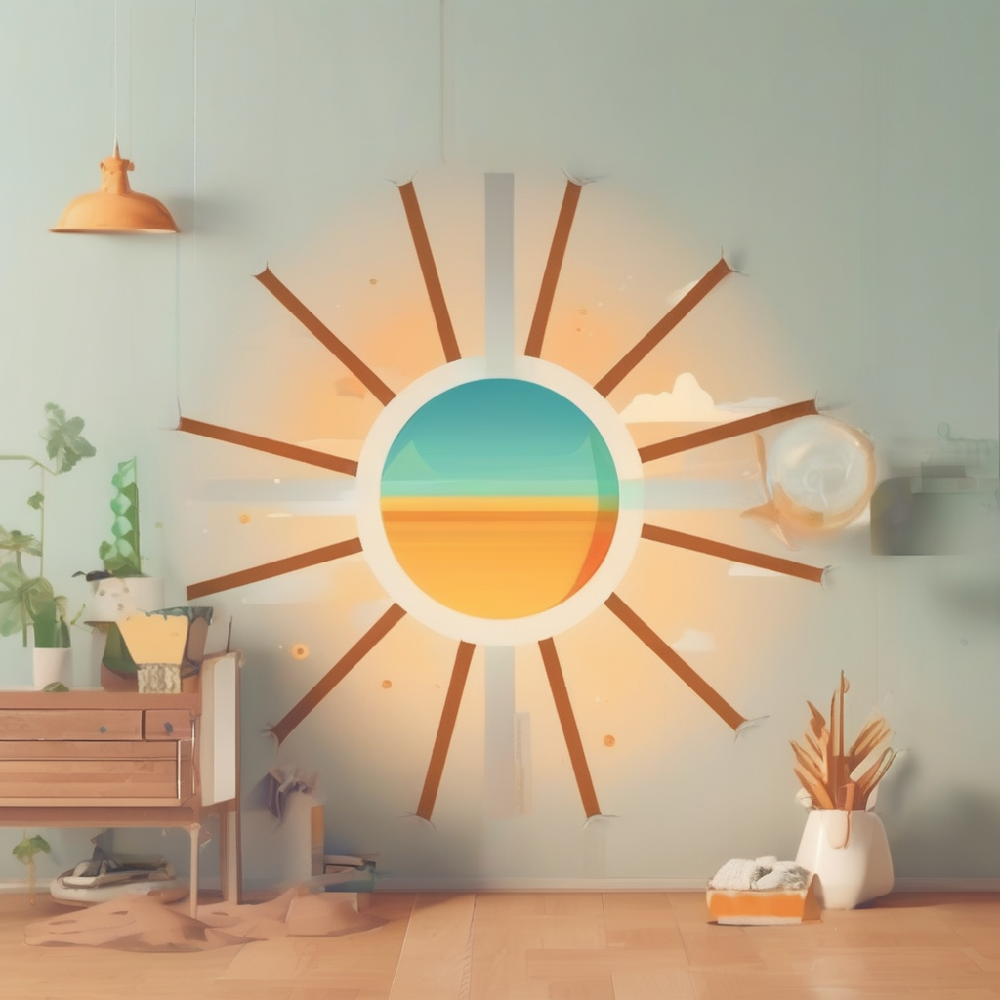
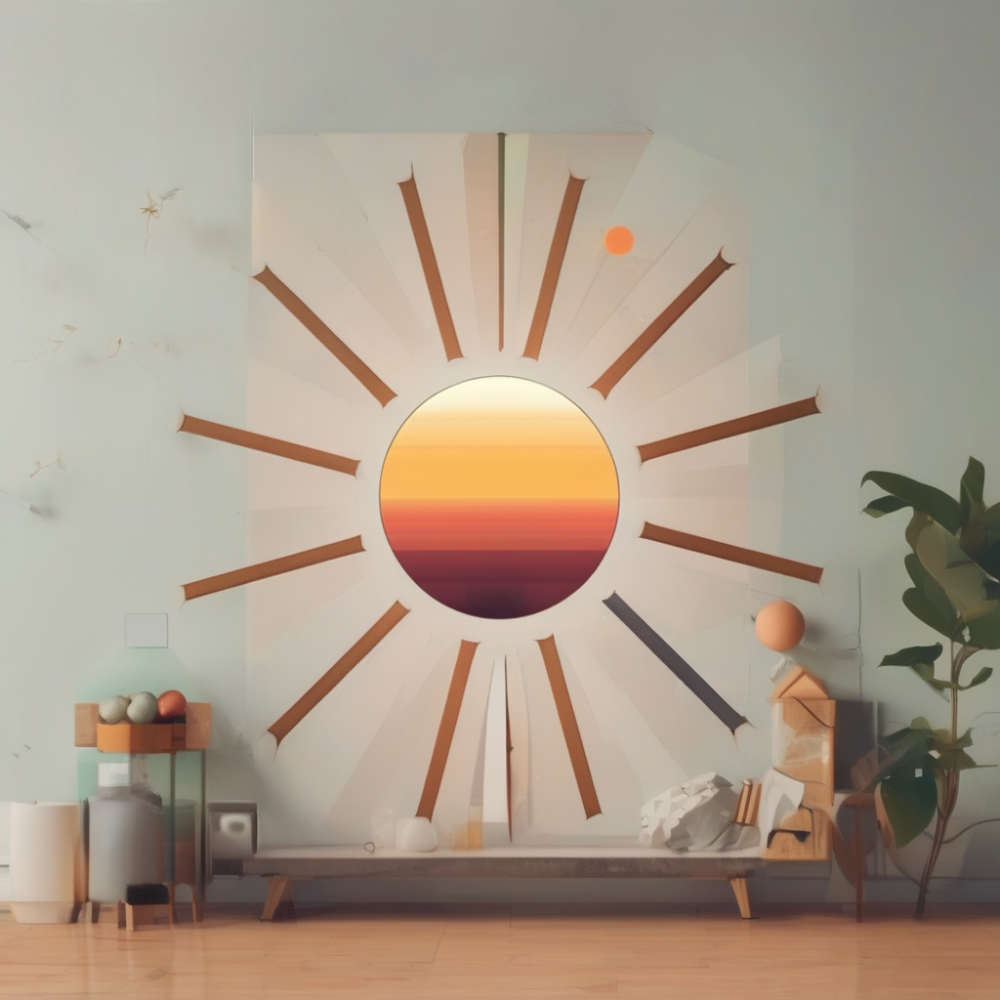
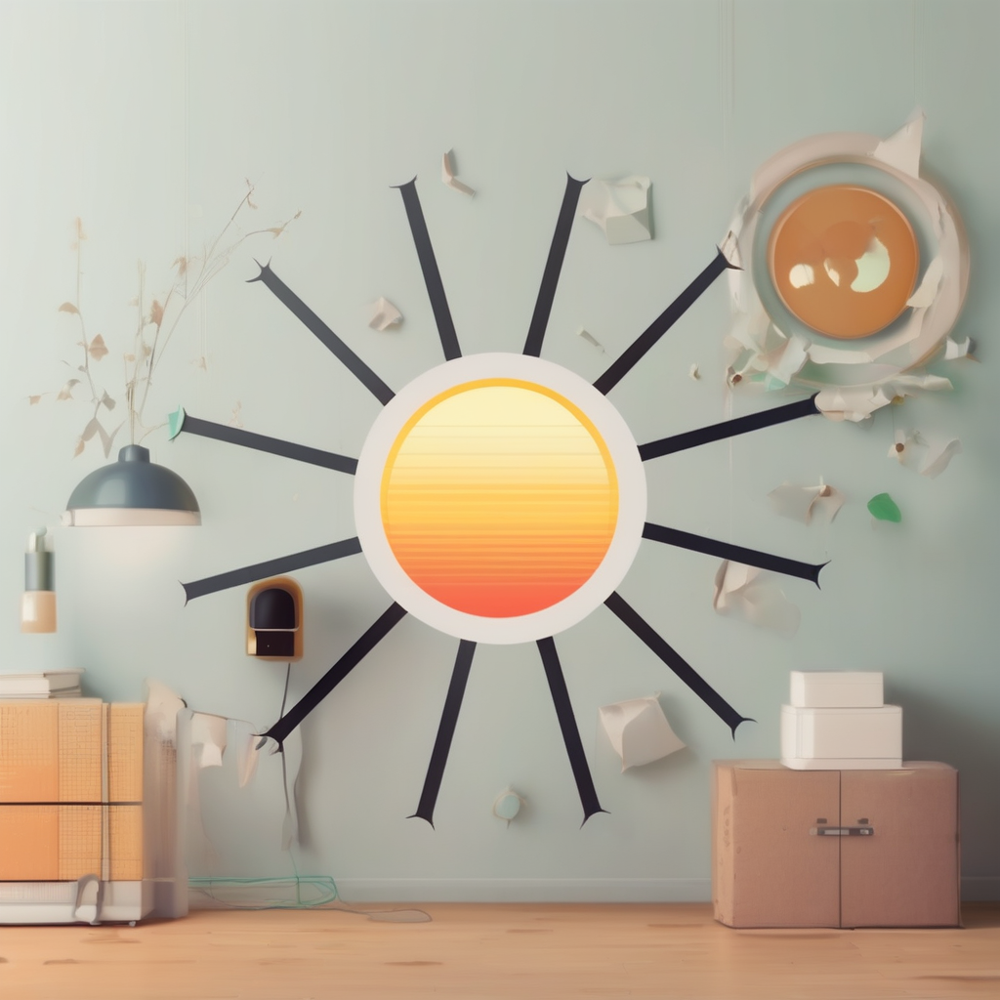

In [8]:
# run ControlNet depth with StyleAligned

reference_prompt = "a poster in flat design style"
target_prompts = ["a train in flat design style", "the sun in flat design style"]
controlnet_conditioning_scale = 0.8
num_images_per_prompt = 3 # adjust according to VRAM size
latents = torch.randn(1 + num_images_per_prompt, 4, 128, 128).to(pipeline.unet.dtype)
for deph_map, target_prompt in zip((depth_image1, depth_image2), target_prompts):
    latents[1:] = torch.randn(num_images_per_prompt, 4, 128, 128).to(pipeline.unet.dtype)
    images = pipeline_calls.controlnet_call(pipeline, [reference_prompt, target_prompt],
                                            image=deph_map,
                                            num_inference_steps=50,
                                            controlnet_conditioning_scale=controlnet_conditioning_scale,
                                            num_images_per_prompt=num_images_per_prompt,
                                           latents=latents)
    
    mediapy.show_images([images[0], deph_map] +  images[1:], titles=["reference", "depth"] + [f'result {i}' for i in range(1, len(images))])
